# Niwot Timeseries Plots

In [1]:
# import packages 
%matplotlib widget
# plotting packages 
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns 

# interactive plotting
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# data packages 
import pandas as pd
import numpy as np
import xarray as xr
from datetime import datetime

import csv 
import copy 
import os.path 

# Load and Clean datasets for use

## Met Data

In [2]:
niwotflux30 = pd.read_csv("/Users/Lumbr/OneDrive - UW/Documents/Washington/UnloadingRegimes/OtherSites/niwot_2017_ameriflux_unload30min.csv")
niwotflux =   pd.read_csv("/Users/Lumbr/OneDrive - UW/Documents/Washington/UnloadingRegimes/OtherSites/niwot_2017_ameriflux_unload1hr.csv")

niwotflux30.index = pd.DatetimeIndex(niwotflux30['datetime'])
niwotflux.index   = pd.DatetimeIndex(niwotflux['datetime'])

# niwotflux30.drop(columns=['datetime'], inplace=True)
# niwotflux.drop(columns=['datetime'], inplace=True)

In [3]:
niwotflux

,datetime,shortwave,longwave,precip,windspeed,RH,temp
datetime,,,,,,,
2016-10-01 00:00:00,2016-10-01 00:00:00,0.000,242.520,0.0,3.610,65.700,6.275
2016-10-01 01:00:00,2016-10-01 01:00:00,0.000,241.955,0.0,3.100,64.720,6.260
2016-10-01 02:00:00,2016-10-01 02:00:00,0.000,241.370,0.0,3.215,65.465,6.010
2016-10-01 03:00:00,2016-10-01 03:00:00,0.000,241.695,0.0,2.780,64.310,6.260
2016-10-01 04:00:00,2016-10-01 04:00:00,0.000,240.795,0.0,3.230,66.315,6.130
...,...,...,...,...,...,...,...
2017-06-30 19:00:00,2017-06-30 19:00:00,6.190,260.635,0.0,1.018,93.920,7.025
2017-06-30 20:00:00,2017-06-30 20:00:00,0.252,294.920,0.0,2.000,93.740,7.120
2017-06-30 21:00:00,2017-06-30 21:00:00,0.000,245.045,0.0,2.440,93.735,6.650


## Classification Obs

In [4]:
# Observations classifications
niwotobs =  pd.read_csv("/Users/Lumbr/OneDrive - UW/Documents/Washington/UnloadingRegimes/OtherSites/Classifications/datetimeformat_classifications_niwot2017.csv")
niwotobs['datetime'] = pd.to_datetime(niwotobs['datetime'])

niwotobs.index = pd.DatetimeIndex(niwotobs['datetime'])
# niwotobs.drop(columns=['datetime'], inplace=True)

niwotobs.dropna(axis=0, how='all', inplace=True) #removing row is entire row is NAN #careful with this, without datetime a lot gets removed 

# Plot

In [5]:
fig = make_subplots(rows=5, cols=1, shared_xaxes=True, vertical_spacing=0.02)
# subplot_titles=("Wind Speed", "Air Temp", "RH", "SW", "LW")

colorstation1='black'

# row 1, wind speed
fig.add_trace(go.Scatter(x = niwotflux['datetime'], y = niwotflux['windspeed'],line_color=colorstation1, name='Ameriflux Data'),row=1, col=1)

# row 2, air temp
fig.add_trace(go.Scatter(x = niwotflux['datetime'], y = niwotflux['temp'],line_color=colorstation1, showlegend=False),row=2, col=1)

fig.add_hline(y=0, line_color='lightgrey', line_width=3, row=2, col=1) # plotly add hline instead of zeros 


# row 3, RH
fig.add_trace(go.Scatter(x = niwotflux['datetime'], y = niwotflux['RH'],line_color=colorstation1, showlegend=False),row=3, col=1)


# row 4, SW
fig.add_trace(go.Scatter(x = niwotflux['datetime'], y = niwotflux['shortwave'],line_color=colorstation1, showlegend=False),row=4, col=1)


# row 5, LW
fig.add_trace(go.Scatter(x = niwotflux['datetime'], y = niwotflux['longwave'],line_color=colorstation1, showlegend=False),row=5, col=1)


# axes 
fig.update_yaxes(title_text='wind speed (m/s)', range=[-1,20],     row=1, col=1)
fig.update_yaxes(title_text='air temp (C)',     range=[-25,25],   row=2, col=1)
fig.update_yaxes(title_text='RH (%)',           range=[0,100],    row=3, col=1)
fig.update_yaxes(title_text='SW (W/m2)',        range=[-100,1200], row=4, col=1)
fig.update_yaxes(title_text='LW (W/mA2)',       range=[100,350],  row=5, col=1)

fig.update_layout(height=1000, width=1200, title_text="Niwot Ridge, Colorado, USA")
fig.show()

# Shade Function

In [6]:
def Shade(fig, df, variable, level, mode, fillcolor, layer, opacity):
  
    """
    Set a specified color as background for given levels of a specified variable using a shape.
    
    Keyword arguments:
    ==================
    fig -- plotly figure
    variable -- column name in a pandas dataframe
    level -- int or float
    mode -- set threshold above or below
    fillcolor -- any color type that plotly can handle
    layer -- position of shape in plotly fiugre, like "below"
    opacity -- opacity of the fillcolor, WORKING but the ordering matters.. so pay attention to that 
    """
    
    if mode == 'above':
        m = df[variable].gt(level)
    
    if mode == 'below':
        m = df[variable].lt(level)
        
    df1 = df[m].groupby((~m).cumsum())['datetime'].agg(['first','last'])

    for index, row in df1.iterrows():
        # print(row['first'], row['last'])
        fig.add_shape(type="rect", xref="x", yref="paper", x0=row['first'], y0=0, x1=row['last'], y1=1, opacity=opacity, line=dict(color="rgba(0,0,0,0)",width=3),fillcolor=fillcolor,layer=layer) 
        fig.add_shape(type="rect", xref="x", yref="paper", x0=row['first'], y0=0, x1=row['last'], y1=1, opacity=opacity, line=dict(color="rgba(0,0,0,0)",width=3),fillcolor=fillcolor,layer=layer)
   
    return(fig)

# Plot Shade Function

In [7]:
# Final Colors for Scatter Plots
## Define some plotting constants for easier coding 
plt.close('all')

# Colors
colornosnow='lightgrey' # the plotly no snow color so that it is lightly and not dominate in the plot 
colorsnow = '#7dcfd4' # slightly desaturated cyan
colorsnowunload = '#1F15D5' # bright, deep blue 
colorsunny = '#E4E44A' # trying a little less bright 

# Grouped Colors
colors = [colorsnow, colorsnowunload] # my colors 

# Names
namesnow = 'Snow Staying'
namesnowunload = 'Snow Unloading'
group_labels = ['Snow Staying', 'Snow Unloading']

nametemp = "Air Temperature (C)"
nameSW = "Shortwave (W/m2)"
namewind = "Wind Speed (m/s)"

colorstation1='black'

## Plotly Code

In [8]:
plt.close()

fig = make_subplots(rows=1, cols=1, shared_xaxes=True, vertical_spacing=0.02)

obs = niwotobs.copy(deep=True)

# using the shade function
fig = Shade(fig = fig, df=obs, variable = 'A', level = .5, mode = 'above', fillcolor = colorsnow,      layer = 'below', opacity=0.5) # if snow, lightblue
fig = Shade(fig = fig, df=obs, variable = 'A', level = .5, mode = 'below', fillcolor = colornosnow,    layer = 'below', opacity=0.5) # if no snow, grey
fig = Shade(fig = fig, df=obs, variable = 'E', level = .5, mode = 'above', fillcolor = colorsunny,     layer = 'below', opacity=0.5) # if sun, yellow
fig = Shade(fig = fig, df=obs, variable = 'CD',level = .5, mode = 'below', fillcolor = colorsnowunload,layer = 'below', opacity=0.3) # if unloading, blue

fig.add_trace(go.Scatter(x = niwotflux['datetime'], y = niwotflux['windspeed'], line_color=colorstation1),row=1, col=1)

# fig.add_hline(y=0, line_color='black', line_width=1, row=1, col=1) # plotly add hline instead of zeros 

fig.update_yaxes(title_text='Wind Speed (m/s)', row=1, col=1)
fig.update_xaxes(title_text='', row=1, col=1)
fig.update_layout(height=400, width=1200, title_text="")

fig.update_xaxes(rangeslider_visible=True, row=1, col=1) # currently set to be under row5, but can prob figure out a better way for subplots if I want it

fig.show()

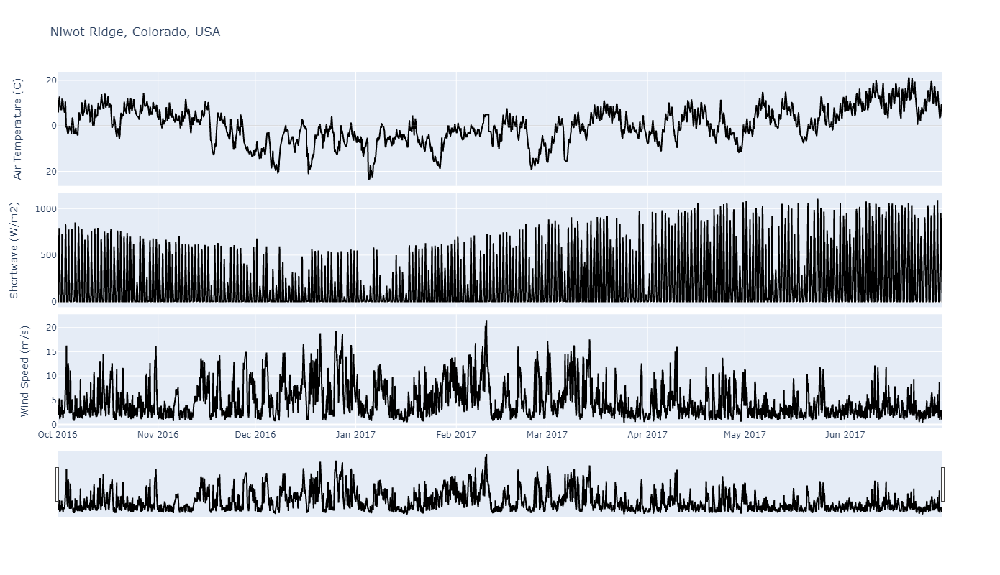

In [14]:
plt.close()

fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.02)

obs = niwotobs.copy(deep=True)

# # using the shade function
# fig = Shade(fig = fig, df=obs, variable = 'A', level = .5, mode = 'above', fillcolor = colorsnow,      layer = 'below', opacity=0.5) # if snow, lightblue
# fig = Shade(fig = fig, df=obs, variable = 'A', level = .5, mode = 'below', fillcolor = colornosnow,    layer = 'below', opacity=0.5) # if no snow, grey
# fig = Shade(fig = fig, df=obs, variable = 'E', level = .5, mode = 'above', fillcolor = colorsunny,     layer = 'below', opacity=0.5) # if sun, yellow
# fig = Shade(fig = fig, df=obs, variable = 'CD',level = .5, mode = 'below', fillcolor = colorsnowunload,layer = 'below', opacity=0.3) # if unloading, blue

fig.add_trace(go.Scatter(x = niwotflux['datetime'], y = niwotflux['temp'], line_color=colorstation1, showlegend=False),row=1, col=1)
fig.add_hline(y=0, line_color='grey', line_width=1, row=1, col=1) # plotly add hline instead of zeros 

fig.add_trace(go.Scatter(x = niwotflux['datetime'], y = niwotflux['shortwave'], line_color=colorstation1, showlegend=False),row=2, col=1)
fig.add_trace(go.Scatter(x = niwotflux['datetime'], y = niwotflux['windspeed'], line_color=colorstation1, showlegend=False),row=3, col=1)


fig.update_yaxes(title_text=nametemp, row=1, col=1)
fig.update_yaxes(title_text=nameSW, row=2, col=1)
fig.update_yaxes(title_text=namewind, row=3, col=1)

fig.update_xaxes(title_text='', row=1, col=1)
fig.update_layout(height=800, width=1200, title_text="Niwot Ridge, Colorado, USA")

fig.update_xaxes(rangeslider_visible=True, row=3, col=1) # currently set to be under row5, but can prob figure out a better way for subplots if I want it

fig.show()

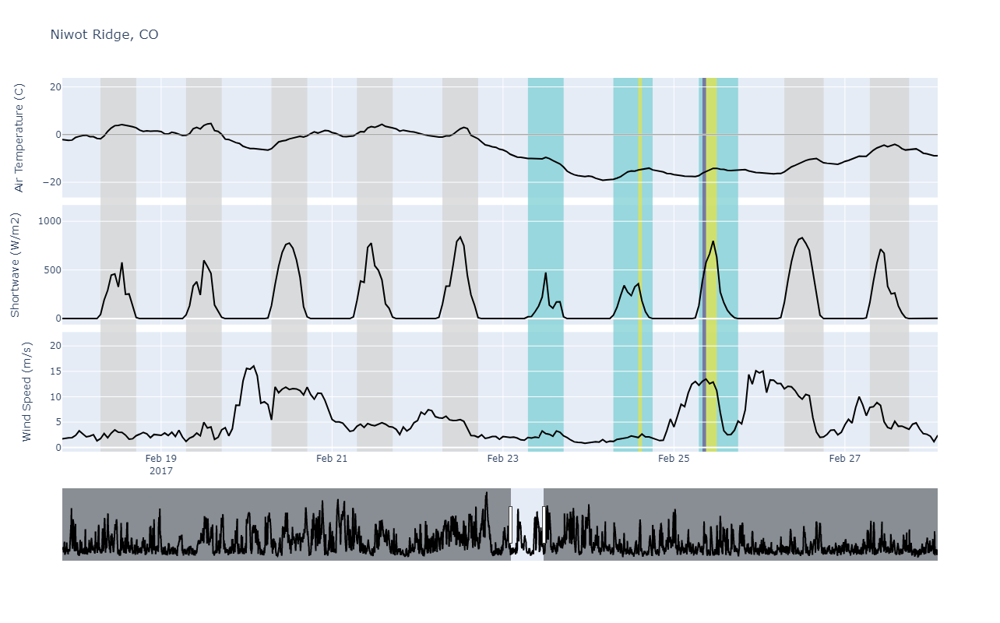

In [7]:
plt.close()

fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.02)

obs = niwotobs.copy(deep=True)

# using the shade function
fig = Shade(fig = fig, df=obs, variable = 'A', level = .5, mode = 'above', fillcolor = colorsnow,      layer = 'below', opacity=0.5) # if snow, lightblue
fig = Shade(fig = fig, df=obs, variable = 'A', level = .5, mode = 'below', fillcolor = colornosnow,    layer = 'below', opacity=0.5) # if no snow, grey
fig = Shade(fig = fig, df=obs, variable = 'E', level = .5, mode = 'above', fillcolor = colorsunny,     layer = 'below', opacity=0.5) # if sun, yellow
fig = Shade(fig = fig, df=obs, variable = 'CD',level = .5, mode = 'below', fillcolor = colorsnowunload,layer = 'below', opacity=0.3) # if unloading, blue

fig.add_trace(go.Scatter(x = niwotflux['datetime'], y = niwotflux['temp'], line_color=colorstation1, showlegend=False),row=1, col=1)
fig.add_hline(y=0, line_color='grey', line_width=1, row=1, col=1) # plotly add hline instead of zeros 

fig.add_trace(go.Scatter(x = niwotflux['datetime'], y = niwotflux['shortwave'], line_color=colorstation1, showlegend=False),row=2, col=1)
fig.add_trace(go.Scatter(x = niwotflux['datetime'], y = niwotflux['windspeed'], line_color=colorstation1, showlegend=False),row=3, col=1)


fig.update_yaxes(title_text=nametemp, row=1, col=1)
fig.update_yaxes(title_text=nameSW, row=2, col=1)
fig.update_yaxes(title_text=namewind, row=3, col=1)

fig.update_xaxes(title_text='', row=1, col=1)
fig.update_layout(height=800, width=1200, title_text="Niwot Ridge, Colorado, USA")

fig.update_xaxes(rangeslider_visible=True, row=3, col=1) # currently set to be under row5, but can prob figure out a better way for subplots if I want it

fig.show()

# Shade2 to show all the times, but it takes more time

In [5]:
def Shade2(fig, df, variable, level, mode, fillcolor, layer, opacity):
  
    """
    Set a specified color as background for given levels of a specified variable using a shape.
    
    Keyword arguments:
    ==================
    fig -- plotly figure
    variable -- column name in a pandas dataframe
    level -- int or float
    mode -- set threshold above or below
    fillcolor -- any color type that plotly can handle
    layer -- position of shape in plotly fiugre, like "below"
    opacity -- opacity of the fillcolor, WORKING but the ordering matters.. so pay attention to that 
    """
    
    if mode == 'above':
        m = df[variable].gt(level)
    
    if mode == 'below':
        m = df[variable].lt(level)
        
    df1 = df[m].groupby((~m).cumsum())['datetime'].agg(['first','last'])

    for index, row in df1.iterrows():
        # print(row['first'], row['last'])
        fig.add_shape(type="rect", xref="x", yref="paper", x0=row['first'], y0=0, x1=row['last'], y1=1, opacity=opacity, line=dict(color=fillcolor, width=3),fillcolor=fillcolor,layer=layer) 
        fig.add_shape(type="rect", xref="x", yref="paper", x0=row['first'], y0=0, x1=row['last'], y1=1, opacity=opacity, line=dict(color=fillcolor, width=3),fillcolor=fillcolor,layer=layer)
   
    return(fig)

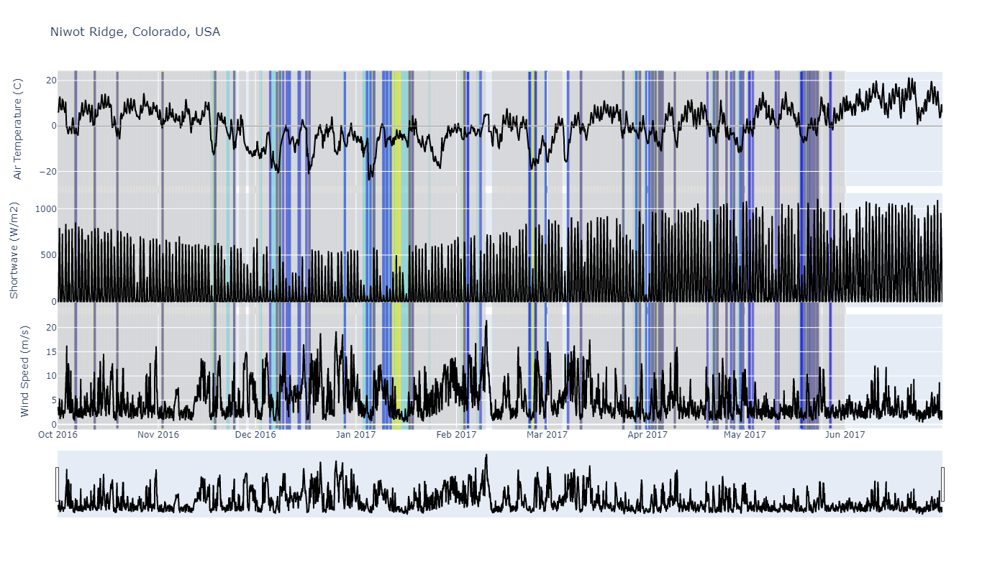

In [7]:
plt.close()

fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.02)

obs = niwotobs.copy(deep=True)

# using the shade function
fig = Shade2(fig = fig, df=obs, variable = 'A', level = .5, mode = 'above', fillcolor = colorsnow,      layer = 'below', opacity=0.5) # if snow, lightblue
fig = Shade2(fig = fig, df=obs, variable = 'A', level = .5, mode = 'below', fillcolor = colornosnow,    layer = 'below', opacity=0.5) # if no snow, grey
fig = Shade2(fig = fig, df=obs, variable = 'E', level = .5, mode = 'above', fillcolor = colorsunny,     layer = 'below', opacity=0.5) # if sun, yellow
fig = Shade2(fig = fig, df=obs, variable = 'CD',level = .5, mode = 'below', fillcolor = colorsnowunload,layer = 'below', opacity=0.3) # if unloading, blue

fig.add_trace(go.Scatter(x = niwotflux['datetime'], y = niwotflux['temp'], line_color=colorstation1, showlegend=False),row=1, col=1)
fig.add_hline(y=0, line_color='grey', line_width=1, row=1, col=1) # plotly add hline instead of zeros 

fig.add_trace(go.Scatter(x = niwotflux['datetime'], y = niwotflux['shortwave'], line_color=colorstation1, showlegend=False),row=2, col=1)
fig.add_trace(go.Scatter(x = niwotflux['datetime'], y = niwotflux['windspeed'], line_color=colorstation1, showlegend=False),row=3, col=1)


fig.update_yaxes(title_text=nametemp, row=1, col=1)
fig.update_yaxes(title_text=nameSW, row=2, col=1)
fig.update_yaxes(title_text=namewind, row=3, col=1)

fig.update_xaxes(title_text='', row=1, col=1)
fig.update_layout(height=800, width=1200, title_text="Niwot Ridge, Colorado, USA")

fig.update_xaxes(rangeslider_visible=True, row=3, col=1) # currently set to be under row5, but can prob figure out a better way for subplots if I want it

fig.show()

# Archived Plots

## Matplotlib Code

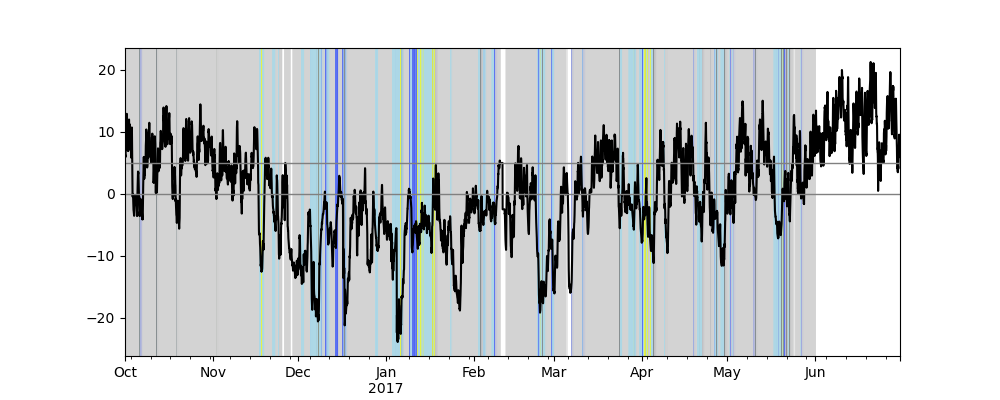

In [11]:
plt.close('all')

plt.rcParams['figure.figsize']  = (10, 4)
niwotflux.temp.plot(color='black')

plt.hlines(y=0, xmin=niwotflux.datetime[0], xmax=niwotflux.datetime[len(niwotflux)-1], colors="grey", linewidth=1)
plt.hlines(y=5, xmin=niwotflux.datetime[0], xmax=niwotflux.datetime[len(niwotflux)-1], colors="grey", linewidth=1)


# this method requires the dataframe to be indexed by datetime 
obs = niwotobs.copy(deep=True)

for i in range(0, len(obs)):
    if obs.A[i] == 0:
        lines1 = plt.axvspan(obs.datetime[i], obs.datetime[i], 0, 20, color='lightgrey', alpha=0.4, linewidth=1.8)
    
    if obs.A[i] == 1:
        lines2 = plt.axvspan(obs.datetime[i], obs.datetime[i], 0, 20, color='lightblue', alpha=0.9, linewidth=1.8)
    
    if obs.E[i] == 1:
        lines1 = plt.axvspan(obs.datetime[i], obs.datetime[i], 0, 20, color='yellow', alpha=0.8, linewidth=1.8)
    
    if obs.CD[i] == 0:
        lines1 = plt.axvspan(obs.datetime[i], obs.datetime[i], 0, 20, color='blue', alpha=0.5, linewidth=1.8)
        
# plt.legend(['temp'])
        
# plt.grid()
plt.show()